In [48]:
## %%# General
import warnings
warnings.filterwarnings ( "ignore" )
import os
from datetime import datetime,timedelta 
import matplotlib.pyplot as plt
from pytictoc import TicToc

# Scientific and data
import numpy as np
from tqdm import tqdm
import pandas as pd
import  xarray as xr
from scipy.ndimage import gaussian_filter1d, gaussian_filter
import seaborn as sns
eps = np.finfo(np.float).eps
import calendar
import matplotlib.dates as mdates

# Local modules
import  learning_lidar.global_settings as gs
from learning_lidar.preprocessing import preprocessing as prep
from learning_lidar.utils.miscLidar import calc_tau,generate_poisson_signal_STEP#, calc_extiction_klett, calc_gauss_curve,generate_poisson_signal

# %% Plotting settings
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300 # sns.set(rc={"figure.dpi":300, 'savefig.dpi':300}) # sns.set_context('notebook')
timeformat = mdates.DateFormatter('%H:%M')
colors = ["darkblue", "darkgreen","darkred"]
# Set your custom color palette
sns.set_palette(sns.color_palette(colors))
customPalette = sns.set_palette(sns.color_palette(colors))

# %% For interactive figures in jupyter lab
#%matplotlib widget #%matplotlib inline
#plt.ion()
#import mpld3
#mpld3.enable_notebook()
# %%

### 1. Set parameters
1. Station & general params
2. Set Height index
3. Choose a day & Set Time index

In [49]:
# %% 1. Station & general params
main_folder=  r'C:\Users\addalin\Dropbox\Lidar\lidar_learning'
station_name = 'haifa'
station = gs.Station (station_name = station_name )
generation_folder = station.generation_folder
folder_name = r'D:\data_haifa\DATA FROM TROPOS\molecular_dataset\2017\09'
wavelengths = gs.LAMBDA_nm().get_elastic() #[355,532,1064]

# %% 2. Set Height index
km_scale = 1e-3
min_height = station.altitude + station.start_bin_height
top_height = station.altitude + station.end_bin_height
heights = np.linspace(min_height * km_scale, top_height * km_scale, station.n_bins)
dr = heights[1]-heights[0]
total_height_bins = heights.size

# %% 3. Choose a day & Set Time index

month = 9
year = 2017
last = (calendar.monthrange(year,month)[1])
month_start_day = datetime(year,month,1)
month_end_day = datetime(year,month,last)

day_number =2
cur_day = month_start_day + timedelta(days=day_number)
day_str = cur_day.strftime('%Y-%m-%d')

min_t = datetime.combine(cur_day.date(), cur_day.time().min)
max_t = cur_day + timedelta(hours = 24) - timedelta(seconds = 30)


time_indx = pd.date_range(start = min_t, end = max_t,freq = '30S')
total_time_bins =  time_indx.size
# %%

### 2. Explore measurements and parameters for the chosen day
1. Load extended calibration database for signal exploration
2. Create daily calibration dataset
3. Visualise typical parameters of measured day as: $LC$, $r_m$ ,$r_0$,$r_1$
> TODO: This section in Analysis notebook

In [50]:
EXPLORE_ORIG_DAY = False
if EXPLORE_ORIG_DAY:
    start_date = datetime ( 2017 , 9 , 1 )
    end_date = datetime ( 2017 , 10 , 31 )
    ds_path_extended = os.path.join(main_folder,'data',f"dataset_{station_name}_{start_date.strftime ( '%Y-%m-%d' )}_{end_date.strftime ( '%Y-%m-%d' )}_extended.nc")
    csv_path_extended = os.path.join(main_folder,'data',f"dataset_{station_name}_{start_date.strftime ( '%Y-%m-%d' )}_{end_date.strftime ( '%Y-%m-%d' )}_extended.csv")
    df = pd.read_csv ( csv_path_extended )
    ds_extended = prep.load_dataset ( ds_path_extended)

    # %%
    day_slice = slice(min_t,cur_day.date()+timedelta(days=1))
    arr_day = []
    for wavelength in wavelengths:
        ds_i = ds_extended.sel(Wavelength = wavelength,Time = day_slice)
        ds_i = ds_i.resample(Time='30S').interpolate('nearest')
        ds_i = ds_i.reindex({"Time" : time_indx}, method="nearest",fill_value =  0)
        arr_day.append(ds_i)
    ds_day = xr.concat(arr_day,dim = 'Wavelength')
    # %%

    # %% Visualize parameters
    DISP_FIG = False
    if DISP_FIG:
        fig, ax = plt.subplots(nrows=1, ncols=1)
        ds_day.LC.plot(x='Time',hue='Wavelength',ax=ax)
        ax.set_title(fr"{ds_day.LC.long_name} for {day_str}")
        plt.tight_layout()
        plt.show()


        fig, ax = plt.subplots(nrows=1, ncols=1)
        for r in ['r0','r1','rm']:
            ds_day[r].sel(Wavelength=355).plot(label=ds_day[r].long_name,ax=ax)
        ax.set_title(fr'Reference Range - {day_str}')
        ax.set_ylabel(r'$\rm Height[km]$')
        plt.legend()
        plt.tight_layout()
        plt.show()

        ds_smooth = ds_day.apply(func = gaussian_filter1d,sigma=80,keep_attrs =True)

        fig, ax = plt.subplots(nrows=1, ncols=1)
        ds_day.LC.plot(x='Time',hue='Wavelength',ax=ax,linewidth=0.8,linestyle='--')
        ds_smooth.LC.plot(x='Time',hue='Wavelength',ax=ax,linewidth=0.8,linestyle='-.')
        ds_extended.sel(Time=slice(cur_day,cur_day+timedelta(hours = 24))).LC.plot(hue='Wavelength',linewidth=0.8)
        ds_extended.sel(Time=slice(cur_day,cur_day+timedelta(hours = 24))).\
            plot.scatter(y='LC',x='Time', hue='Wavelength',s=30,hue_style ='discrete',edgecolor='w')

        ax.set_title(fr"{ds_day.LC.long_name} for {day_str}")
        plt.tight_layout()
        plt.show()

### 3. Generate total backscatter and extinction distribution
1. Load generated aerosol profiles
2. Load molecular profiles
3. Calculate total distribution: Summing aerosol and molecular profiles
    - $\beta = \beta_{aer}+\beta_{mol}$
    - $\sigma = \sigma_{aer}+\sigma_{mol}$
    > The molecular profiles were calculated from radiosondes measurements from NOA
    > TODO: Blend or "fade" the aerosol layer before adding to molecular density

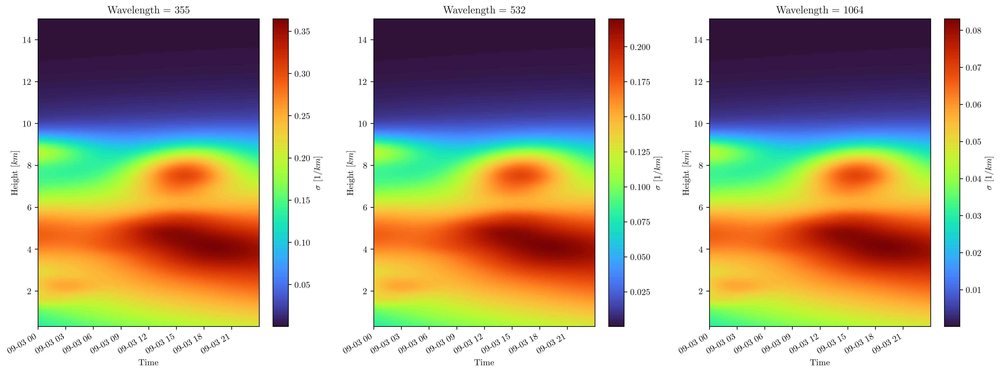

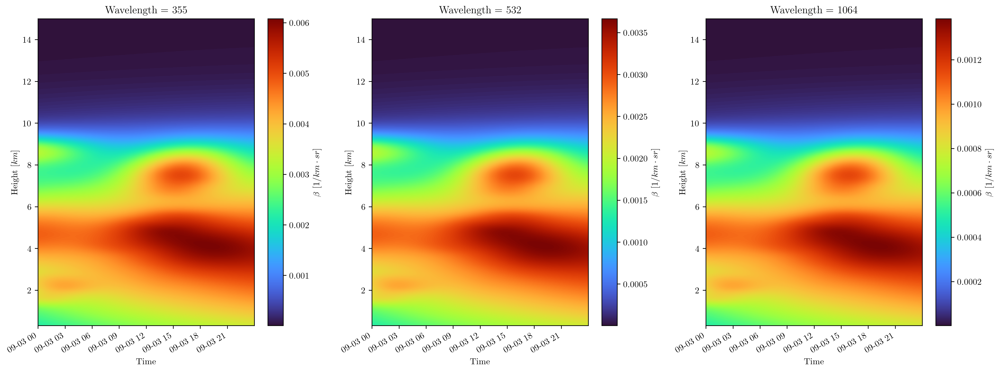

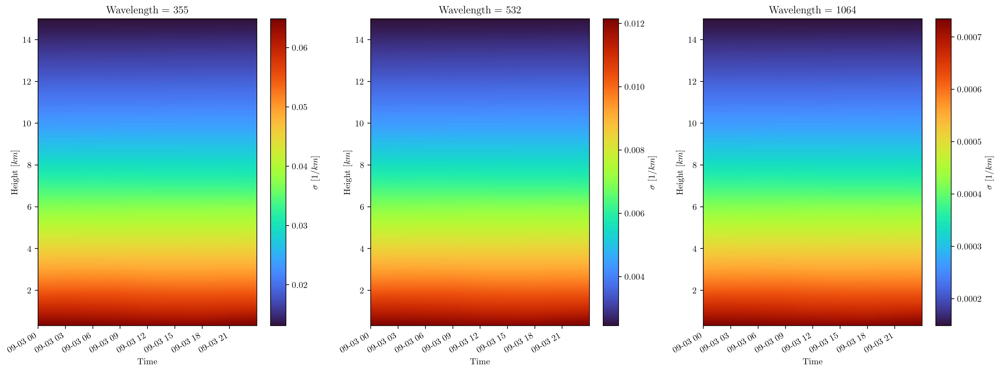

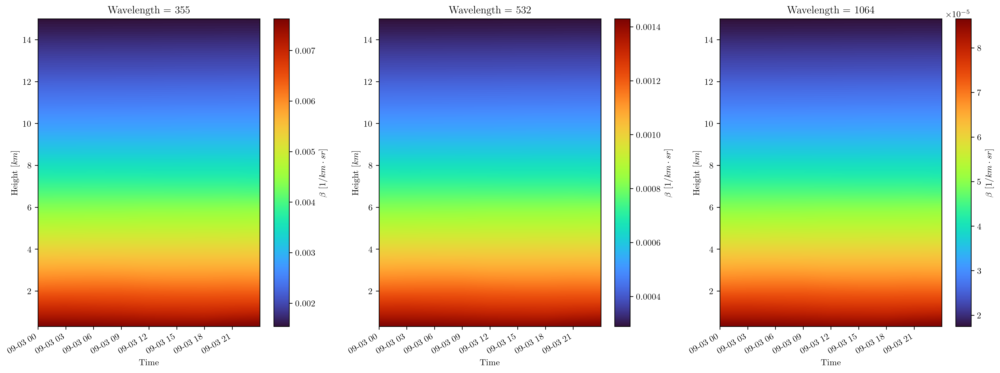

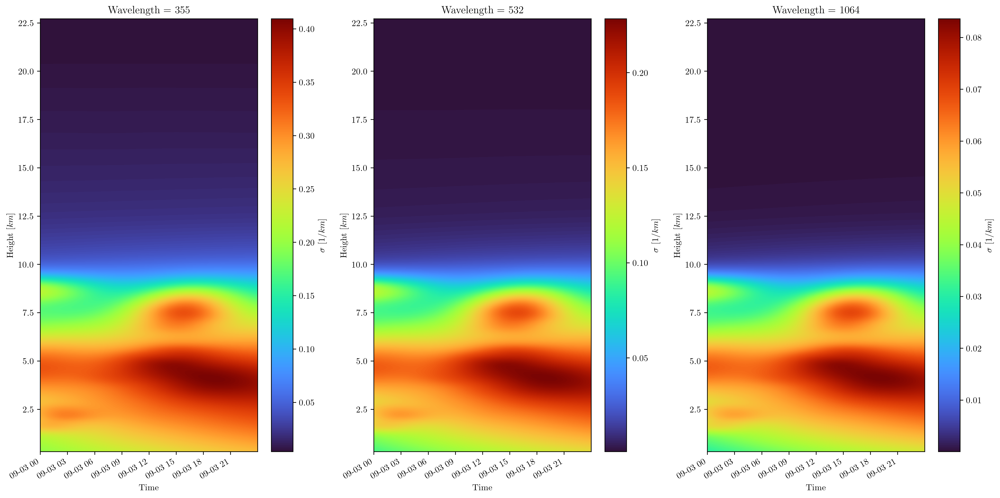

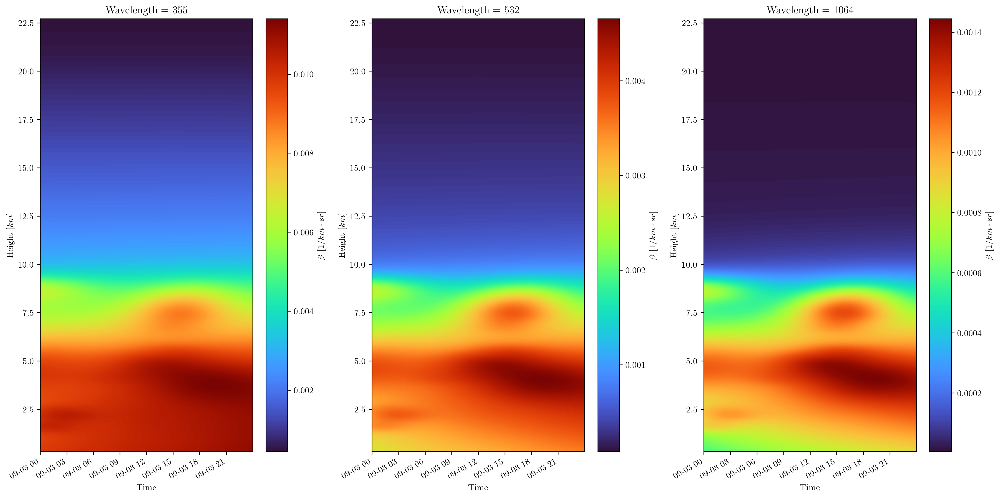

In [51]:
# %% 1. Load generated aerosol profiles
month_folder = os.path.join(month_start_day.strftime ( "%Y" ),month_start_day.strftime ( "%m" ))
aer_folder = os.path.join(generation_folder,'aerosol_dataset',month_folder)
nc_aer = f"{cur_day.strftime('%Y_%m_%d')}_{station_name.capitalize()}_aerosol.nc"
ds_aer = prep.load_dataset(os.path.join(aer_folder,nc_aer))
sigma_aer = ds_aer.sigma
beta_aer = ds_aer.beta

DISP_FIG = True
if DISP_FIG:
	height_slice=slice(0.0,15)
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,6))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		sigma_aer.sel(Height=height_slice, Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,6))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		beta_aer.sel(Height=height_slice, Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

# %% 2. Load molecular profiles

month_folder = os.path.join(station.molecular_dataset,month_start_day.strftime ( "%Y" ),month_start_day.strftime ( "%m" ))

nc_name = f"{cur_day.strftime('%Y_%m_%d')}_{station_name.capitalize()}_molecular.nc"
ds_mol = prep.load_dataset(os.path.join(month_folder,nc_name))

if DISP_FIG:
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,6))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		ds_mol.sigma.sel(Height=height_slice, Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,6))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		ds_mol.beta.sel(Height=height_slice, Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

# %% 3. Calculate total distribution

ds_total = xr.zeros_like(ds_mol)
ds_total= ds_total.assign(date= ds_mol.date)
ds_total.attrs = {'info': 'Daily generated profiles',
                  'sources_file': 'generate_density.ipynb',
                  'location': station.name}
ds_total.lambda_nm.loc[:] = wavelengths

ds_total.sigma.loc[:] = ds_mol.sigma + sigma_aer
ds_total.beta.loc[:] = ds_mol.beta + beta_aer

if DISP_FIG:
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		ds_total.sigma.sel(Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		ds_total.beta.sel(Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()
# %%

### 3. Generate lidar signal
1. Calculating the attenuated backscatter $\beta_{\rm attbsc} = \beta\exp(-2\tau)$
2. Load daily generated Lidar power factor
3. Calculating range corrected signal $p\cdot r^2 =LC_{generated}\cdot\beta\exp(-2\tau)$
    - Calculate a new Lidar signal $p$,based on LC generated p_day_gen.
    $p\cdot r^2 = {LC_{\rm generated}}\cdot\beta\exp(-2\tau) = {LC_{\rm generated}}\cdot\beta_{\rm attbsc}$
    > see  generation process at: `generate_LC_pattern.ipynb`
4. Calculating lidar signal $p = \frac{LC_{generated}\cdot \beta_{\rm attbsc}}{r^2}$

Time loop for 1064: 100%|██████████| 2880/2880 [00:08<00:00, 356.39it/s]


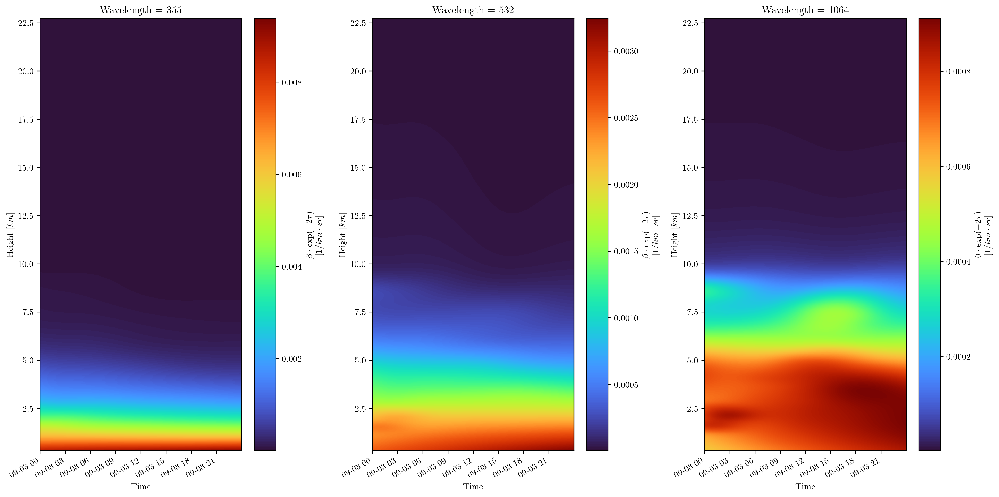

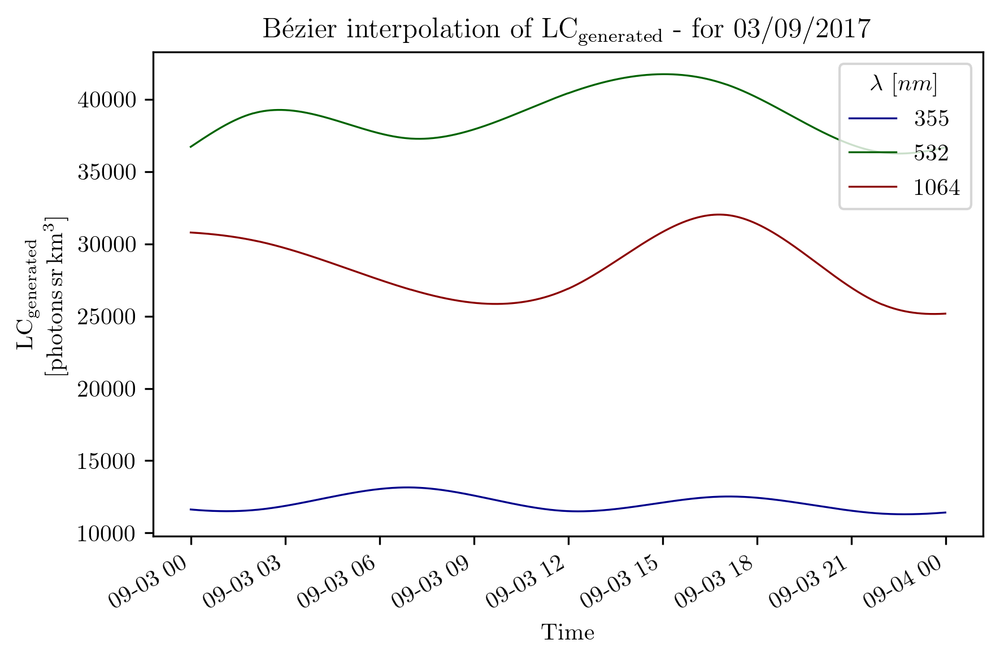

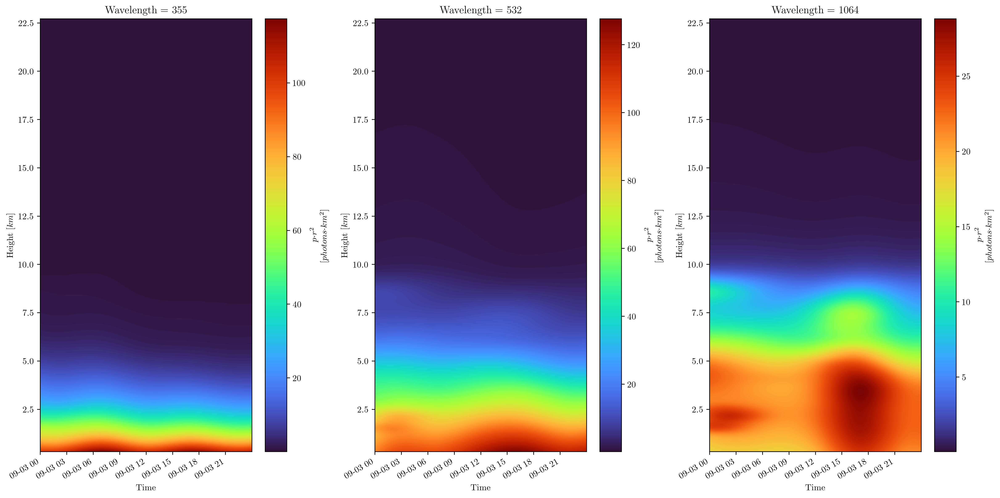

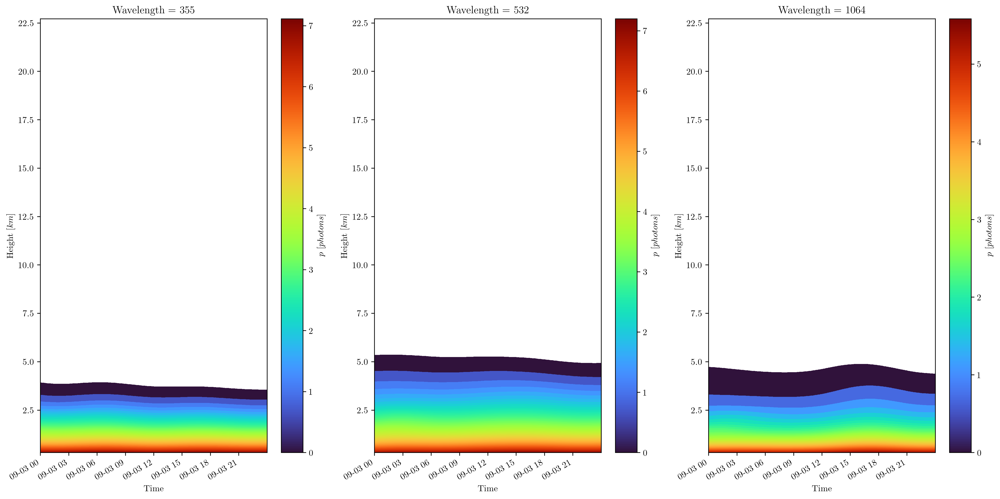

In [52]:
# %% 1. Calculating the attenuated backscatter
exp_tau_c =[]
for wavelength in wavelengths:
	exp_tau_t =[]
	for t in tqdm(ds_total.Time):
		sigma_t = ds_total.sigma.sel(Time= t)
		e_tau = xr.apply_ufunc(lambda x: np.exp(-2*calc_tau(x,heights)),
		                       sigma_t.sel(Wavelength= wavelength),keep_attrs = True)
		e_tau.name = r'$\exp(-2 \tau)$'
		exp_tau_t.append(e_tau)

	exp_tau_c.append(xr.concat(exp_tau_t,dim = 'Time'))
exp_tau_d = xr.concat(exp_tau_c,dim = 'Wavelength')
exp_tau_d = exp_tau_d.transpose('Wavelength','Height','Time' )
ds_total.attbsc.loc[:] = exp_tau_d.loc[:]*ds_total.beta

for profile in ['beta','sigma','attbsc']:
    ds_total[profile].attrs['info'] = ds_total[profile].attrs['info'].replace('Molecular','Total')


if DISP_FIG:
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		ds_total.attbsc.sel(Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

# %% 2. Load daily generated Lidar power factor
nc_power = f"generated_LC_{station.name}_{start_date.strftime('%Y-%m-%d')}_{end_date.strftime('%Y-%m-%d')}.nc"
ds_gen_p = prep.load_dataset(os.path.join(generation_folder,nc_power))
day_slice = slice(cur_day,cur_day+timedelta(hours = 24)-timedelta(seconds = 30))
p_day_gen = ds_gen_p.p.sel(Time=day_slice)

DISP_FIG = True
if DISP_FIG:
	p_day_gen.plot(hue='Wavelength',linewidth=0.8)
	#ds_gen_p.sel(Time=tday).plot.scatter(y='p_new',x='Time',hue='Wavelength',s=15,hue_style ='discrete',edgecolor='w')
	plt.title(fr"B\'ezier interpolation of {ds_gen_p.p.long_name} - for {cur_day.strftime('%d/%m/%Y' )}")
	plt.tight_layout()
	plt.show()

# %% 3. Calculating range corrected signal
pr2_c =[]
for wavelength in wavelengths:
    pr2_t =[]
    p_t=[]
    for t in tqdm(ds_total.Time,desc = f'Time loop for {wavelength}'):
        attbsc_t = ds_total.attbsc.sel(Time= t)
        LC_t = p_day_gen.sel(Time = t)
        pr2 = xr.apply_ufunc(lambda x,y:(x*y)  ,
                            attbsc_t.sel(Wavelength= wavelength),
                            LC_t.sel(Wavelength= wavelength),keep_attrs = True)
        pr2.name = r'$pr2$'
        pr2_t.append(pr2)
        
    pr2_c.append(xr.concat(pr2_t,dim = 'Time'))
    
pr2_d = xr.concat(pr2_c,dim = 'Wavelength')
pr2_d = pr2_d.transpose('Wavelength','Height','Time' )
pr2_d.attrs = { 'info': 'Lidar Range Corrected Signal',
                'long_name': r'$p$'+r'$\cdot r^2$',
                'units': r'$\rm$'+r'$photons$'+r'$\cdot km^2$'}



DISP_FIG = True
if DISP_FIG:
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		pr2_d.sel(Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

# %% 4. Calculating lidar signal

rr_im = np.tile(heights.reshape(total_height_bins,1),(len(wavelengths),1,total_time_bins))**2

ds_total = ds_total.assign(rr= xr.Variable(dims=('Wavelength','Height','Time'),data = rr_im))
p_d = (pr2_d/ds_total.rr).astype(int)
p_d.attrs = { 'info': 'Lidar Signal',
              'long_name': r'$p$',
              'units': r'$\rm$'+r'$photons$'}
p_d.name = r'$p$'

if DISP_FIG:
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		log_p = xr.apply_ufunc(lambda p:np.log(p),p_d.sel(Wavelength = wavelength),keep_attrs = True)
		log_p.plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()
# %%

### 5. Generate Lidar measurement
1. Load bg mean signal per month
>  Created daily mean background signal in: generate_bg_signals.ipynb
2. Slice the relevant day of the monthly signal
3. Calculate mean signal: $\mu_{p} =\mathbb{E}(p) + <p_{bg}>$
4. Calculate signal measure: $P_{measure}\sim Poiss (\mu_{p} ) $
    - Note:  for $\mu_{p}>50$: $Poiss (\mu_{p}) = \mu_{p} + \sqrt{\mu_{p}}\cdot  \mathcal{N}(0,1)$
    > This is to save time and power of computations
    >
    > The poisson distribution calculated only for values lower then 50 - to assure we dont get negative values
5. Calculate generated range corrected signal $p_{measure}\cdot r^2$

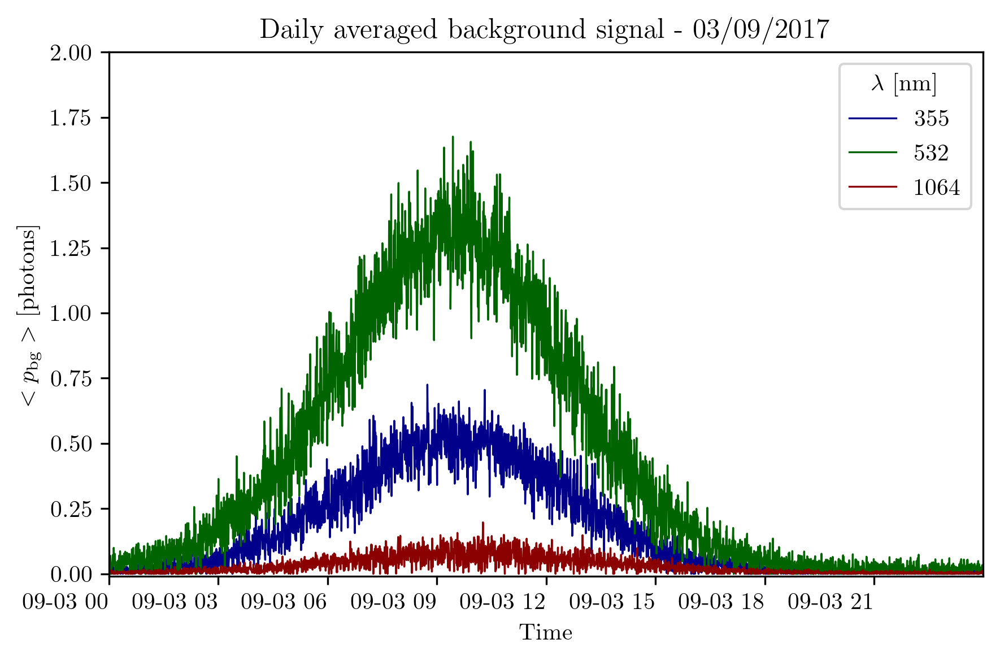

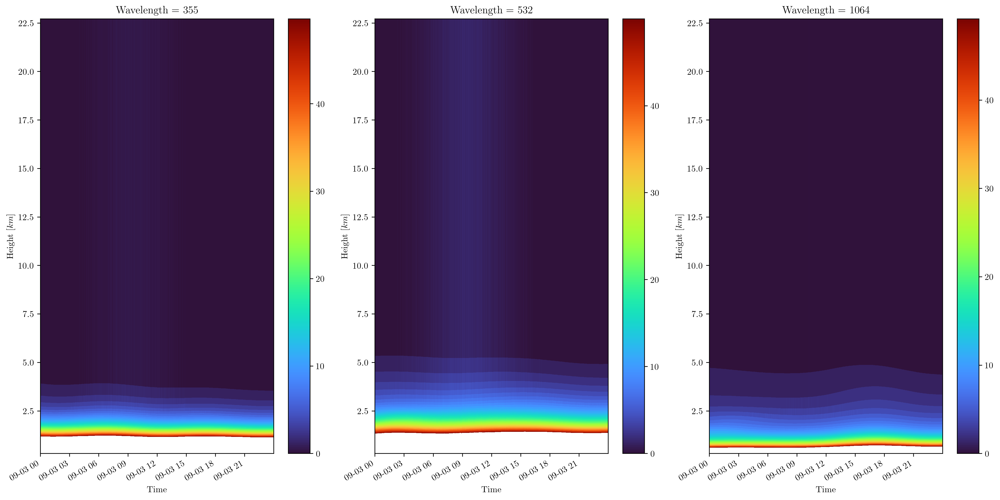

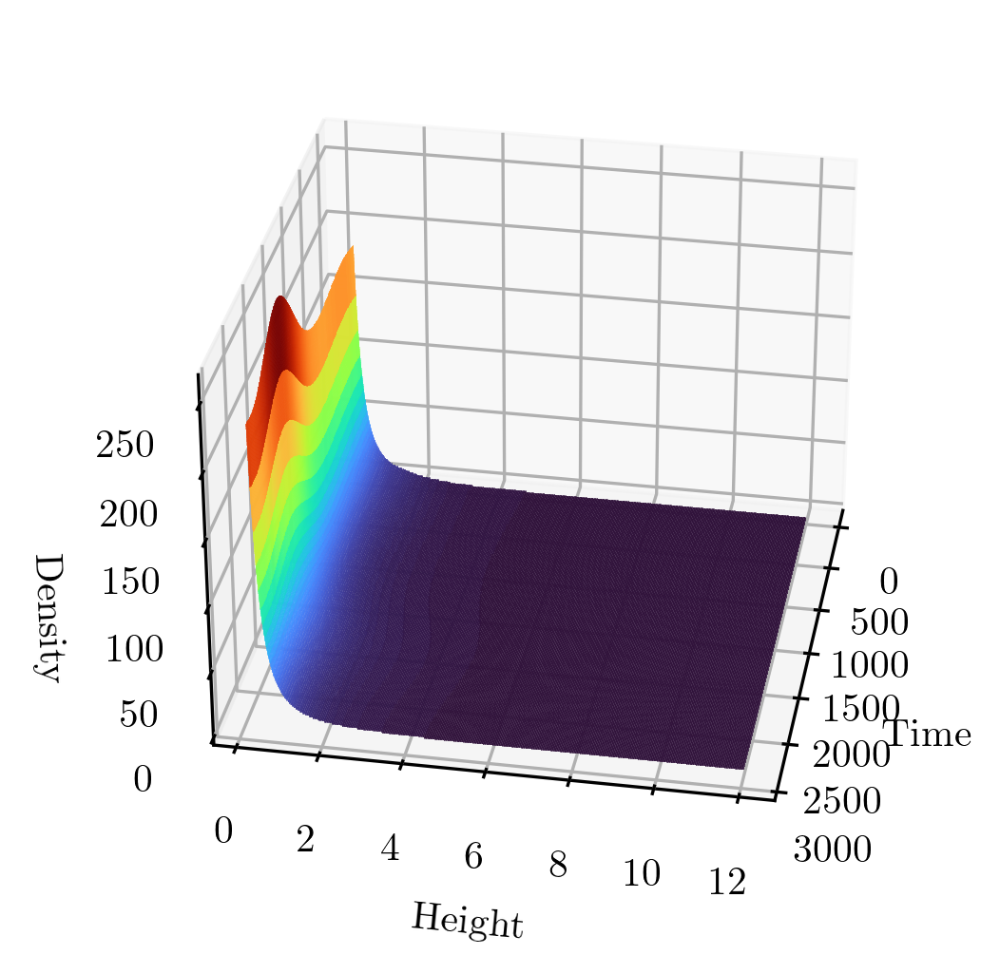

poisson STEP: 100%|██████████| 25920000/25920000 [02:03<00:00, 210153.54it/s]


Elapsed time is 124.462896 seconds.


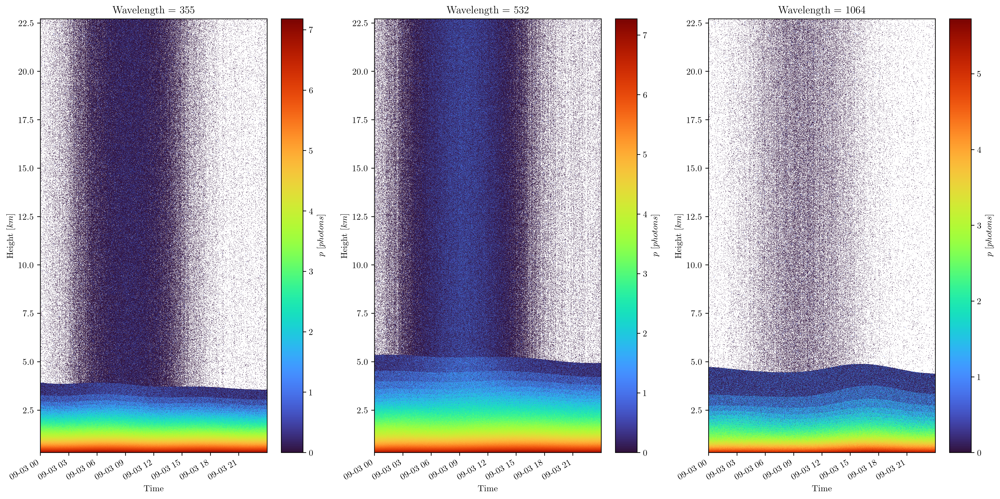

In [53]:
# %% 1. Load bg mean signal per month
nc_name = f"generated_bg_{station.name}_{month_start_day.strftime('%Y-%m-%d')}_{month_end_day.strftime('%Y-%m-%d')}.nc"
bg_folder= os.path.join(generation_folder,'bg_dataset')
ds_bg =  prep.load_dataset(ncpath =os.path.join( bg_folder, nc_name))

# %% 2. Slice the relevant day of the monthly signal

day_slice = slice(cur_day,cur_day+timedelta(days = 1)-timedelta(seconds = 30))
ds_total = ds_total.assign( bgmean = ds_bg.sel(Time = day_slice).bg)

if DISP_FIG:
	fig, ax = plt.subplots(ncols=1,nrows=1)
	ds_total.bgmean.sel(Time = day_slice).plot(hue='Wavelength', ax=ax,linewidth=0.8)
	ax.set_xlim([day_slice.start,day_slice.stop])
	ax.set_title(f"{ds_bg.bg.info} - {cur_day.strftime('%d/%m/%Y')}")
	plt.xticks(rotation=0)
	ax.set_ybound([-.01,2])
	plt.tight_layout()
	plt.show()


# %% 3. Calculate mean signal
p_mean = p_d + ds_total.bgmean

if DISP_FIG:
    # plot 2D figure
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
    for wavelength,ax in zip(wavelengths,axes.ravel()):
        p_mean.where(p_mean<50).sel(Wavelength = wavelength).plot(cmap='turbo',ax=ax)
    plt.tight_layout()
    plt.show()
    
    # plot 3D surf figure
    X = np.arange(0, total_time_bins, 1)
    th = 12.0
    Y = pr2_d.Height.sel(Height=slice(0,th)).values
    X, Y = np.meshgrid(X, Y)
    Z = p_d.sel(Wavelength = wavelength,Height=slice(0,th)).values
    ax = plt.axes(projection='3d')
    surf = ax.plot_surface(X, Y, Z, cmap = 'turbo',
                           linewidth=0.1,rstride=5,alpha=.5,
                           cstride=5, antialiased=False)
    ax.set_ylabel('Height')
    ax.set_xlabel('Time')
    ax.set_zlabel('Density')
    #ax.set_ylim([0,5.0])
    fig.colorbar(surf, shrink=0.8, aspect=5)
    ax.view_init(30, 10)
    plt.show()

# %% 4. Calculate signal measure

tic0 = TicToc()
tic0.tic()
pn_h = xr.apply_ufunc(lambda mu: (mu + (np.sqrt(mu))*np.random.normal(loc=0, scale=1.0,size=mu.shape)).astype(int),
                       p_mean.where(p_mean>=50).fillna(0),keep_attrs =True)
pn_l = xr.apply_ufunc(lambda mu:generate_poisson_signal_STEP(mu),
                         p_mean.where(p_mean<50).fillna(0),keep_attrs =True,dask = 'parallelized')
tic0.toc()
pn_ds = pn_h+pn_l

pn_ds.attrs = { 'info': 'Poisson Lidar Signal',
                'long_name': r'$p$',
                'units': r'$\rm$'+r'$photons$'}

if DISP_FIG:
	fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
	for wavelength,ax in zip(wavelengths,axes.ravel()):
		log_p = xr.apply_ufunc(lambda p:np.log(p) ,pn_ds.sel(Wavelength = wavelength),keep_attrs = True)
		log_p.plot(cmap='turbo',ax=ax)
		#pn_ds.sel(Wavelength = wavelength).plot(cmap='turbo',ax=ax)
	plt.tight_layout()
	plt.show()

# %% 5. Calculate generated range corrected signal
pr2n_d = (pn_ds*ds_total.rr)

pr2n_d.attrs = { 'info': 'Poisson Lidar Range Corrected Signal',
                 'long_name': r'$p$'+r'$\cdot r^2$',
                 'units': r'$\rm$'+r'$photons$'+r'$\cdot km^2$'}


DISP_FIG = True
if DISP_FIG:
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
    for wavelength,ax in zip(wavelengths,axes.ravel()):
        log_p = xr.apply_ufunc(lambda p:np.log(p),pr2n_d.sel(Wavelength = wavelength),keep_attrs = True)
        log_p.plot(cmap='turbo',ax=ax)
        #pr2n_d.where(pr2n_d>=0.0).sel(Wavelength = wavelength).plot(cmap='turbo',ax=ax)
    plt.tight_layout()
    plt.show()

    fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(8,16))
    for ax,wavelength in zip(axes.ravel(),wavelengths):
        log_p = xr.apply_ufunc(lambda p:np.log(p),pr2n_d.sel(Wavelength = wavelength),keep_attrs = True)
        log_p.plot(cmap='turbo',ax=ax)
        #pr2n_d.sel(Wavelength = wavelength).plot(cmap='turbo', ax=ax)
        ax.xaxis.set_major_formatter(timeformat)
    plt.tight_layout()
    plt.show()

# %% 6. Save lidar and range corrected signal , and measurments
> TODO: finish saving of signals

In [ ]:
"""month_folder = os.path.join(station.generation_folder,'lidar_dataset',
                            month_start_day.strftime("%Y"), month_start_day.strftime("%m"))

nc_aer = fr"{cur_day.strftime('%Y_%m_%d')}_{station_name.capitalize()}_lidar.nc"

prep.save_dataset(ds_aer,month_folder,nc_aer)"""

In [55]:
type(p_d.values[0][0][0])
type(ds_total.bgmean.values[0][0])
type(p_mean.values[0][0][0])
pr2n_d

<xarray.DataArray (Wavelength: 3, Height: 3000, Time: 2880)>
array([[[101.52278906, 103.04801406, 100.09289063, ..., 107.81434219,
         108.86293438, 101.14148281],
        [ 97.79609984, 108.1956851 , 103.29588051, ..., 114.59542987,
         111.4955535 , 104.49583265],
        [ 96.08060726,  97.96659519, 107.39653484, ..., 108.75863723,
         110.53984805, 103.72933609],
        ...,
        [  0.        ,   0.        ,   0.        , ...,   0.        ,
           0.        ,   0.        ],
        [  0.        ,   0.        ,   0.        , ...,   0.        ,
           0.        ,   0.        ],
        [  0.        ,   0.        ,   0.        , ...,   0.        ,
           0.        ,   0.        ]],

       [[ 99.23495156,  92.65741875,  90.17892813, ..., 114.96383438,
         120.20679531, 119.15820313],
        [ 95.19620353,  91.59634709,  95.39619555, ..., 118.19528631,
         120.5951906 , 120.79518262],
        [100.27169155,  89.06054108,  96.49971569, ..., 120.38889612,
         123.53220934, 126.25641412],
...
        [  0.        ,   0.        ,   0.        , ...,   0.        ,
           0.        ,   0.        ],
        [  0.        ,   0.        ,   0.        , ...,   0.        ,
           0.        ,   0.        ],
        [  0.        ,   0.        ,   0.        , ...,   0.        ,
           0.        ,   0.        ]],

       [[ 19.54194531,  17.15878125,  17.73074063, ...,  21.63912969,
          18.49335313,  23.16435469],
        [ 18.89924629,  17.59929813,  18.09927819, ...,  22.99908278,
          21.69913463,  25.89896714],
        [ 16.97389136,  17.28822268,  17.70733111, ...,  21.06019854,
          23.26051779,  21.79363829],
        ...,
        [  0.        ,   0.        ,   0.        , ...,   0.        ,
           0.        ,   0.        ],
        [  0.        ,   0.        ,   0.        , ...,   0.        ,
           0.        ,   0.        ],
        [  0.        ,   0.        ,   0.        , ...,   0.        ,
           0.        ,   0.        ]]])
Coordinates:
  * Height      (Height) float64 0.3088 0.3162 0.3237 ... 22.7 22.71 22.72
  * Time        (Time) datetime64[ns] 2017-09-03 ... 2017-09-03T23:59:30
  * Wavelength  (Wavelength) uint64 355 532 1064
Attributes:
    info:       Poisson Lidar Range Corrected Signal
    long_name:  $p$$\cdot r^2$
    units:      $\rm$$photons$$\cdot km^2$

### 6. Exploring 1D generated profiles of:
- $p$
- $p\cdot r^2$
- $p_{\rm Poiss}$
- $p_{\rm Poiss}\cdot r^2$
> TODO: This section in Analysis notebook

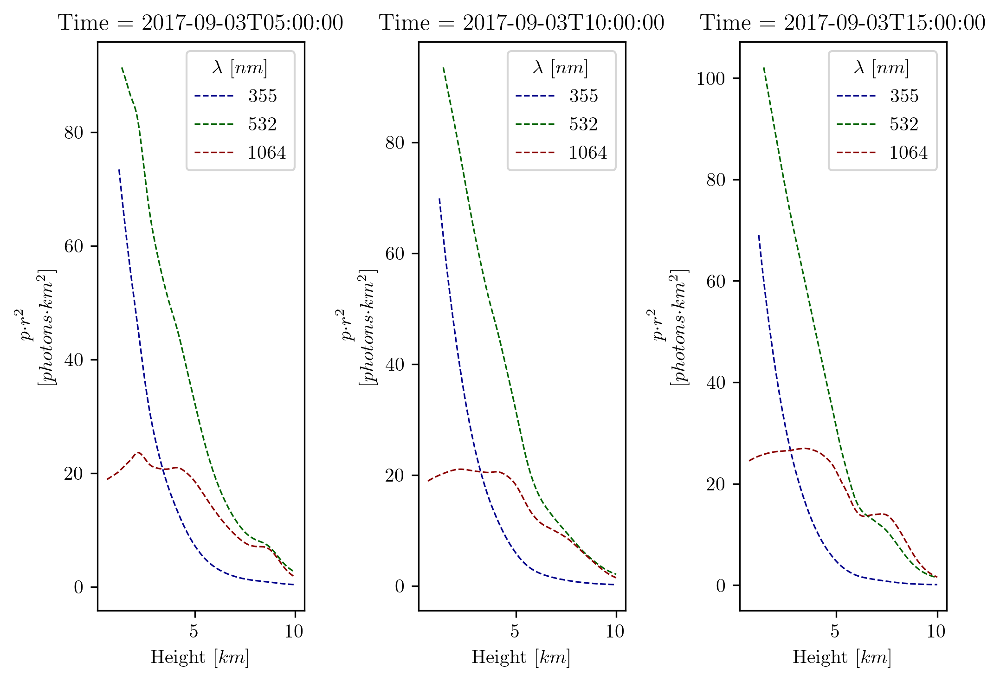

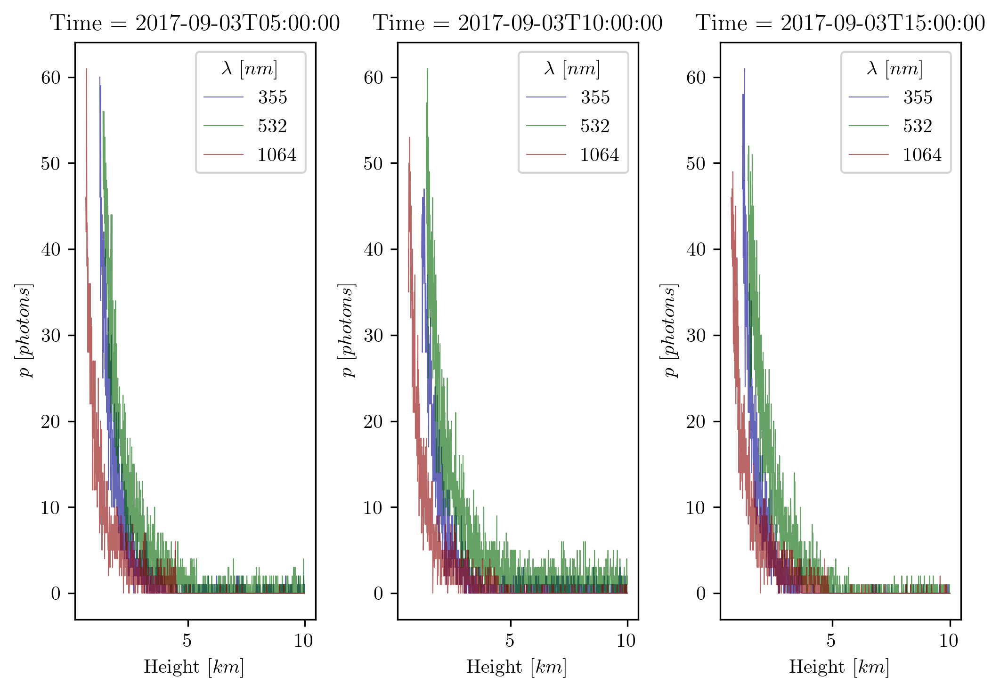

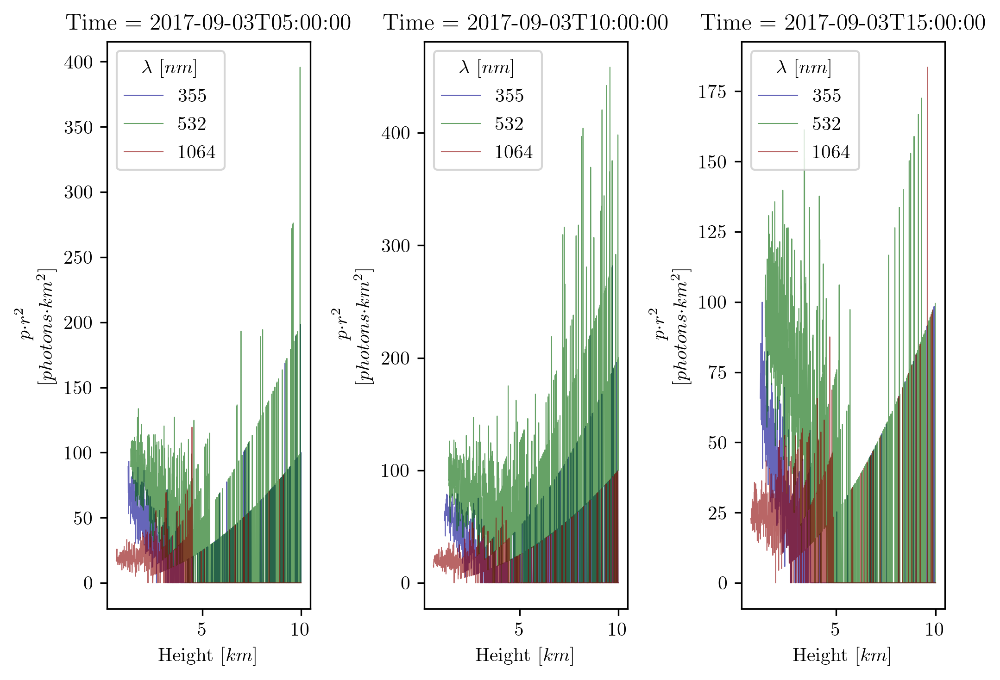

In [56]:
EXPLORE_GEN_DAY = False
if EXPLORE_GEN_DAY:
    DISP_FIG = True
    if DISP_FIG:
        Times = cur_day + np.array([timedelta(hours = 5),timedelta(hours = 10),timedelta(hours = 15)])
        fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(7,5))
        for t,ax in zip(Times,axes.ravel()):
            pr2_d.where(p_mean<50).sel(Time = t,Height=slice(0,10)).plot(ax=ax,hue='Wavelength',linestyle='--',linewidth=0.8)
        plt.tight_layout()
        plt.show()


        fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(7,5))
        for t,ax in zip(Times,axes.ravel()):
            pn_ds.where(p_mean<50).sel(Time = t,Height=slice(0,10)).plot(ax=ax,hue='Wavelength',linewidth=0.5,alpha=0.6)
        plt.tight_layout()
        plt.show()

        fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(7,5))
        for t,ax in zip(Times,axes.ravel()):
            pr2n_d.where(p_mean<50).sel(Time = t,Height=slice(0,10)).plot(ax=ax,hue='Wavelength',linewidth=0.5,alpha=0.6)
        plt.tight_layout()
        plt.show()

### 7. Exploring up-sampled and down-sampled data to check the "stairs" effect of multiplying / dividing by $r^2$
1. Testing: $p = \frac {LC_{\rm generated}\cdot\beta_{\rm attbsc}}{r^2}$
 - Upsampling / downsampling ${LC_{\rm generated}\cdot\beta_{\rm attbsc}}$
 - Calculating $p = \frac {LC_{\rm generated}\cdot\beta_{\rm attbsc}}{\hat r^2}$
 - Where:
    - for up-sample case: $\hat r = \frac{1}{2}\cdot r$
    - for down-sample case: $\hat r = 2\cdot r$
> TODO: This section in Analysis notebook

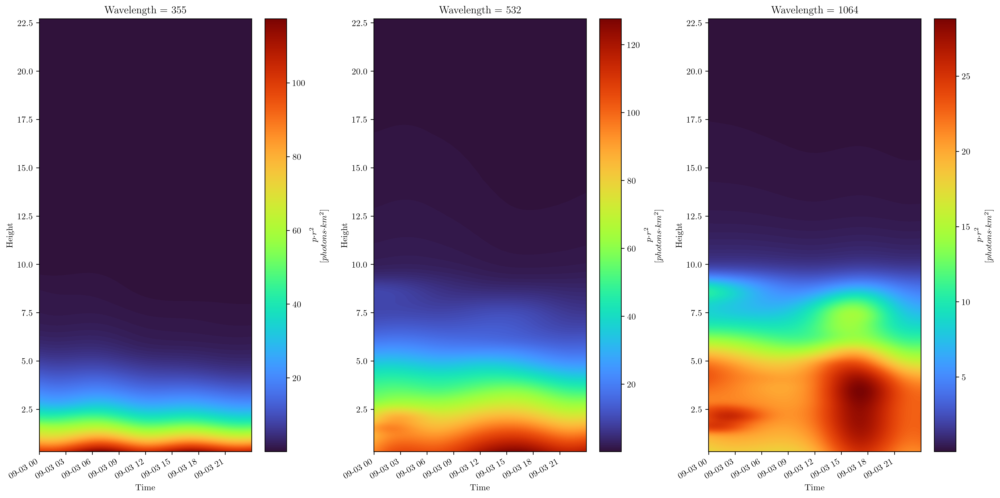

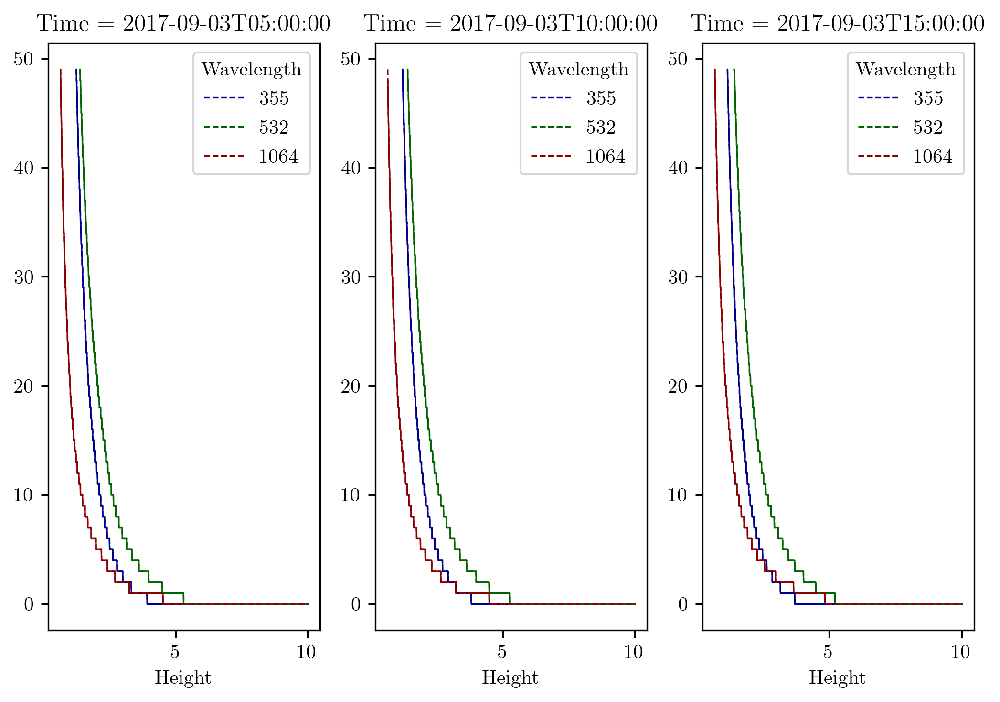

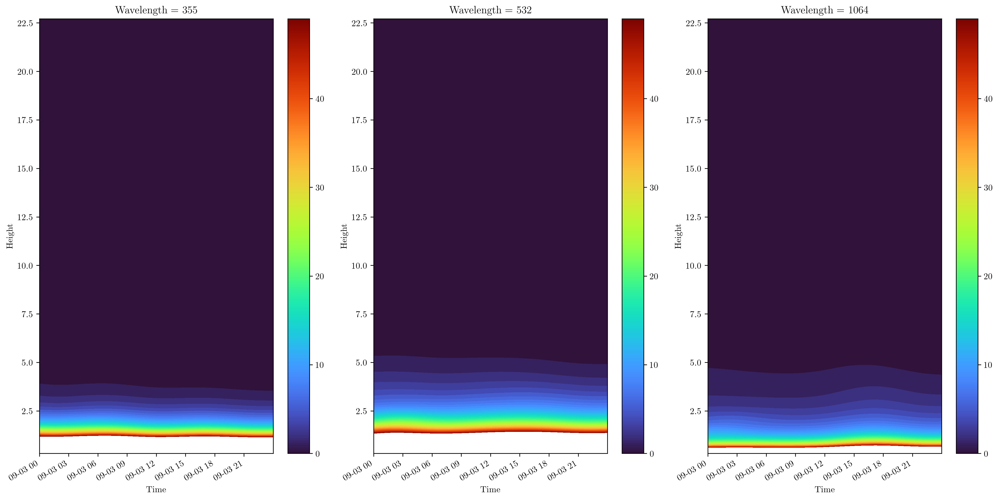

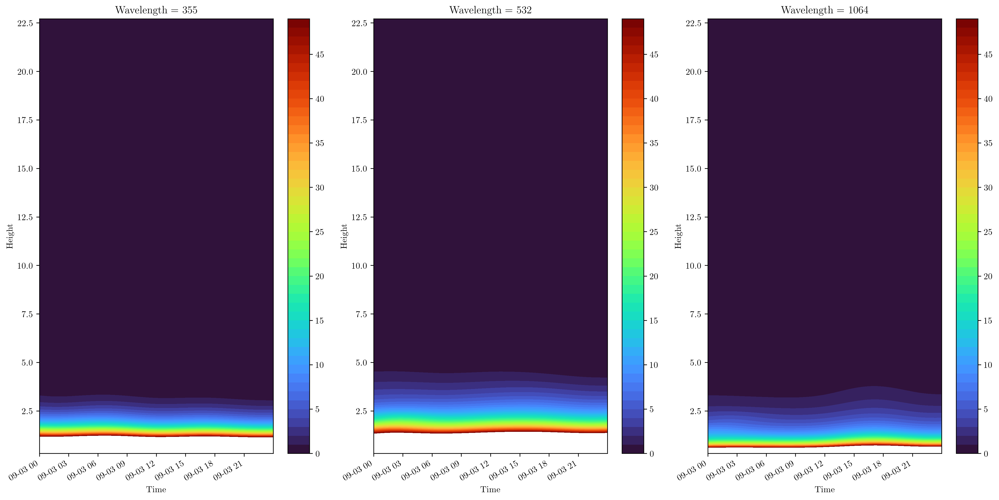

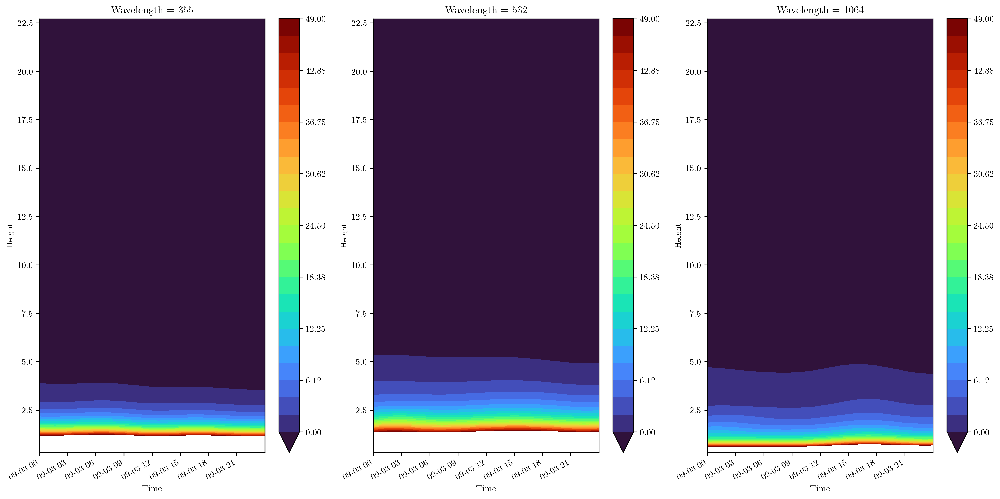

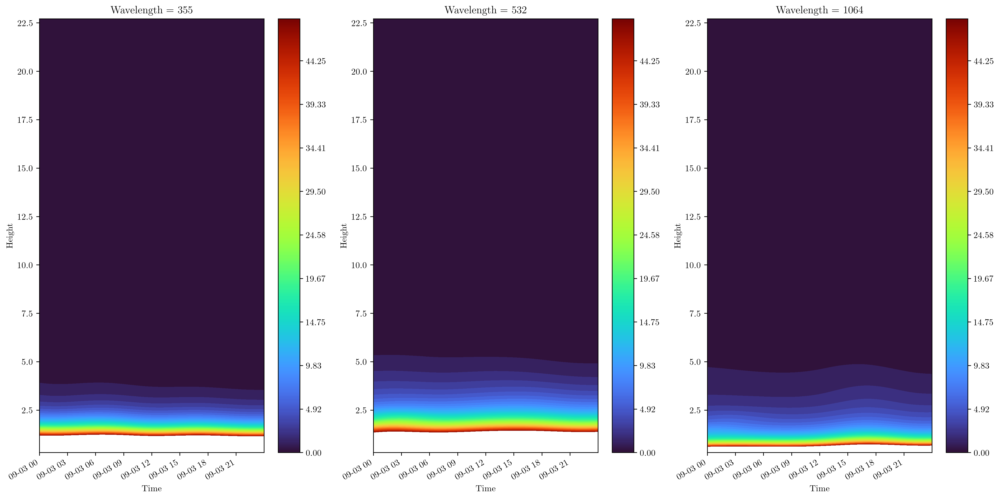

In [57]:
if EXPLORE_GEN_DAY:
    DISP_FIG = True
    start_h = heights[0]
    end_h = heights[-1]
    scale = 0.25
    new_height_size = int(total_height_bins/scale)
    new_heights = np.linspace(start= start_h,stop= end_h,num=new_height_size,endpoint=True)

    temp = xr.DataArray(np.zeros((new_height_size,total_time_bins,len(wavelengths))),
                        [("Height",new_heights),("Time",pr2_d.Time.values),("Wavelength",pr2_d.Wavelength.values)])
    up_pr2d =  pr2_d.interp_like(temp, method='linear')


    if DISP_FIG:
        # 2D plot of up-sampled range corrected
        fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
        for wavelength,ax in zip(wavelengths,axes.ravel()):
            up_pr2d.sel(Wavelength = wavelength).plot(cmap='turbo',ax=ax)
        plt.tight_layout()
        plt.show()

if EXPLORE_GEN_DAY:
    new_rr_im = np.tile(temp.Height.values.reshape(new_height_size,1),
                    (pr2_d.Wavelength.size,1,pr2_d.Time.size))**2
    da_rr = xr.DataArray(dims=('Wavelength','Height','Time'),data = new_rr_im)
    up_pd = (up_pr2d/da_rr).astype(int)

    if DISP_FIG:

        # %%1D plot of up-sampled signal
        Times = cur_day+np.array([timedelta(hours = 5),timedelta(hours = 10),timedelta(hours = 15)])
        fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(7,5))
        for t,ax in zip(Times,axes.ravel()):
            p_d.where(p_d<50).sel(Time = t,Height=slice(0,10)).plot(ax=ax,hue='Wavelength',linewidth=0.8)
            up_pd.where(up_pd<50).sel(Time = t,Height=slice(0,10)).plot(ax=ax,hue='Wavelength',linewidth=0.8,linestyle='--')
        plt.tight_layout()
        plt.show()

        #%Testing changes in 2D plotting for several plot functions
        # %% 2D plot
        fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
        for wavelength,ax in zip(wavelengths,axes.ravel()):
            #log_p = xr.apply_ufunc(lambda p:np.log(p),up_pd.sel(Wavelength = wavelength),keep_attrs = True)
            #log_p.plot(cmap='turbo',ax=ax)
            up_pd.where(up_pd<50).sel(Wavelength = wavelength).plot(cmap='turbo',ax=ax)
            #xr.plot.contourf(p_d.where(p_d<50).sel(Wavelength = wavelength),p_d.Time)
            #.plot.counturf(cmap='turbo',ax =ax)
        plt.tight_layout()
        plt.show()

        # %% contourf
        fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
        for wavelength,ax in zip(wavelengths,axes.ravel()):
            xr.plot.contourf(up_pd.where(up_pd<50).sel(Wavelength = wavelength),
                             x = 'Time',y = 'Height',cmap='turbo',ax =ax,levels=50)
        plt.tight_layout()
        plt.show()

        # %% pcolormesh
        fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
        for wavelength,ax in zip(wavelengths,axes.ravel()):
            xr.plot.pcolormesh(up_pd.where(up_pd<50).sel(Wavelength = wavelength),
                             x = 'Time',y = 'Height',cmap='turbo',
                               ax =ax,levels=25,rasterized=True,
                               vmin=eps,vmax = up_pd.where(up_pd<50).sel(Wavelength = wavelength).max().values)
        plt.tight_layout()
        plt.show()

        # %%pcolormesh with different color division
        fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
        for wavelength,ax in zip(wavelengths,axes.ravel()):
            xr.plot.pcolormesh(up_pd.where(up_pd<50).sel(Wavelength = wavelength),
                             x = 'Time',y = 'Height',cmap='turbo',
                               ax =ax,levels=300,rasterized=True,
                               vmin=up_pd.where(up_pd<50).sel(Wavelength = wavelength).min().values,
                               vmax = up_pd.where(up_pd<50).sel(Wavelength = wavelength).max().values)
        plt.tight_layout()
        plt.show()